<a href="https://colab.research.google.com/github/airctic/icevision/blob/master/notebooks/negative_samples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to use negative examples

In some scenarios it might be useful to explicitly show the model images that should be considered background, these are called "negative examples" and are images that do not contain any annotations.

In this tutorial we're going to be training two raccoons detectors and observe how they perform on images of dogs and cats. One of the models will be trained only with images of raccoons, while the other will also have access to images of dogs and cats (the negative examples).

As you might already have imagined, the model that was trained with raccoon images predicts all animals to be raccoons!

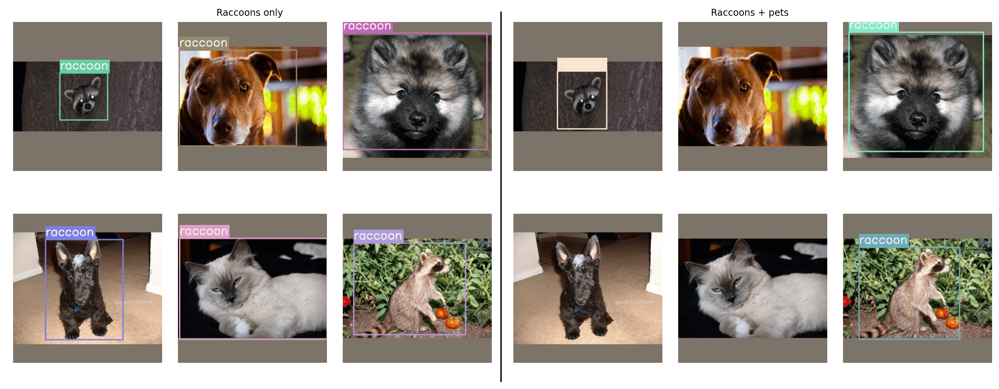

## Installing IceVision and IceData
If on Colab run the following cell, else check the [installation instructions](https://airctic.com/dev/install/)

Install from pypi...

In [1]:
# # Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
# !wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# # Choose your installation target: cuda11 or cuda10 or cpu
# !bash icevision_install.sh cuda11

... or from icevision master

In [ ]:
# Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11 master

In [ ]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

## Imports

In [1]:
from icevision.all import *

## Raccoon dataset

The dataset is stored on github, so a simple `git clone` will do.

In [2]:
!git clone https://github.com/datitran/raccoon_dataset

fatal: destination path 'raccoon_dataset' already exists and is not an empty directory.


The raccoon dataset uses the VOC annotation format, icevision natively supports this format:

In [3]:
raccoon_data_dir = Path('raccoon_dataset')
raccoon_parser = parsers.VOCBBoxParser(annotations_dir=raccoon_data_dir /'annotations', images_dir=raccoon_data_dir /'images')

Let's go ahead and parse our data with the default 80% train, 20% valid, split.

In [4]:
raccoon_train_records, raccoon_valid_records = raccoon_parser.parse()

  0%|          | 0/200 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/200 [00:00<?, ?it/s]

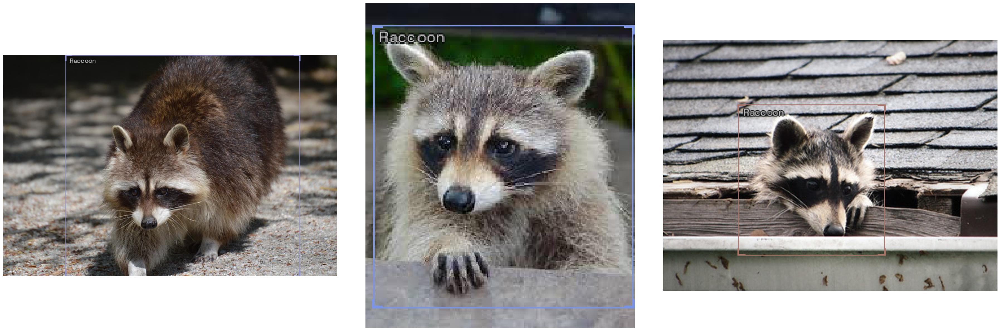

In [5]:
show_records(random.choices(raccoon_train_records, k=3), ncols=3, class_map=class_map)

## Pets dataset

With icedata we can easily download the pets dataset:

In [6]:
pets_data_dir = icedata.pets.load_data() / 'images'

Here we have a twist, instead of using the standard parser (`icedata.pets.parser`) which would parse all annotations, we will instead create a custom parser that only parsers the images.

Remember the steps for generating a custom parser (check [this](https://airctic.com/custom_parser/) tutorial for more information).

In [7]:
pets_template_record = ObjectDetectionRecord()

In [8]:
Parser.generate_template(pets_template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_img_size(<ImgSize>)
        record.set_filepath(<Union[str, Path]>)
        record.detection.add_bboxes(<Sequence[BBox]>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)


And now we use that to fill the required methods. We don't have to use the `.detection` methods since we don't want bboxes for these images.

In [9]:
class PetsImageParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)
        self.image_filepaths = get_image_files(data_dir)

    def __iter__(self) -> Any:
        yield from self.image_filepaths
        
    def __len__(self) -> int:
        return len(self.image_filepaths)

    def record_id(self, o) -> Hashable:
        return o.stem
    
    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_img_size(get_img_size(o))
            record.set_filepath(o)

Now we're ready to instantiate the parser and parse the data:

In [10]:
pets_parser = PetsImageParser(pets_template_record, pets_data_dir)
pets_train_records, pets_valid_records = pets_parser.parse()

  0%|          | 0/7390 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/7390 [00:00<?, ?it/s]

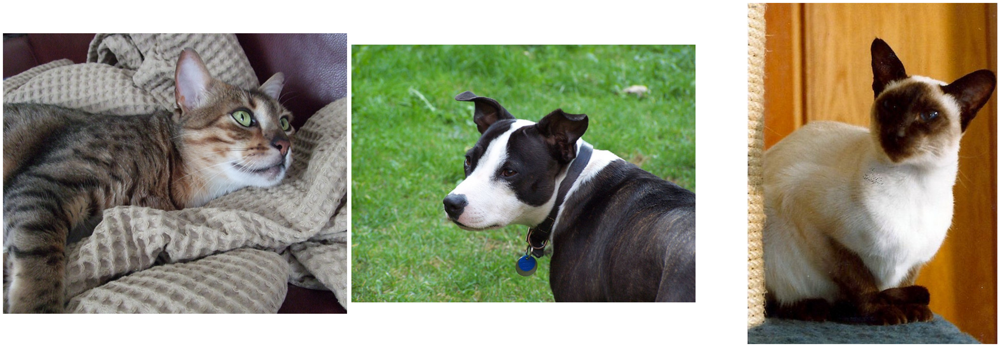

In [11]:
show_records(random.choices(pets_train_records, k=3), ncols=3)

## Transforms

Let's define a simple list of transforms, they are the same for both datasets.

In [12]:
presize = 512
size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])

## Datasets and DataLoaders

We create the raccoon dataset and dataloader as normal:

In [13]:
model_type = models.ross.efficientdet

In [14]:
batch_size = 8

In [15]:
raccoon_train_ds = Dataset(raccoon_train_records, train_tfms)
raccoon_valid_ds = Dataset(raccoon_valid_records, valid_tfms)

raccoon_train_dl = model_type.train_dl(raccoon_train_ds, batch_size=batch_size, num_workers=4, shuffle=True)
raccoon_valid_dl = model_type.valid_dl(raccoon_valid_ds, batch_size=batch_size, num_workers=4, shuffle=False)

For adding the pets data, we simply have to combine the list of records. Note that the pets dataset contains a lot more images than the raccoon dataset, so we'll get only 100 images for train and 30 for valid, feel free to change these numbers and explore the results!

In [16]:
combined_train_ds = Dataset(raccoon_train_records + pets_train_records[:100], train_tfms)
combined_valid_ds = Dataset(raccoon_valid_records + pets_valid_records[:30], valid_tfms)

combined_train_dl = model_type.train_dl(combined_train_ds, batch_size=batch_size, num_workers=4, shuffle=True)
combined_valid_dl = model_type.valid_dl(combined_valid_ds, batch_size=batch_size, num_workers=4, shuffle=False)

Let's take a look at the combined dataset:

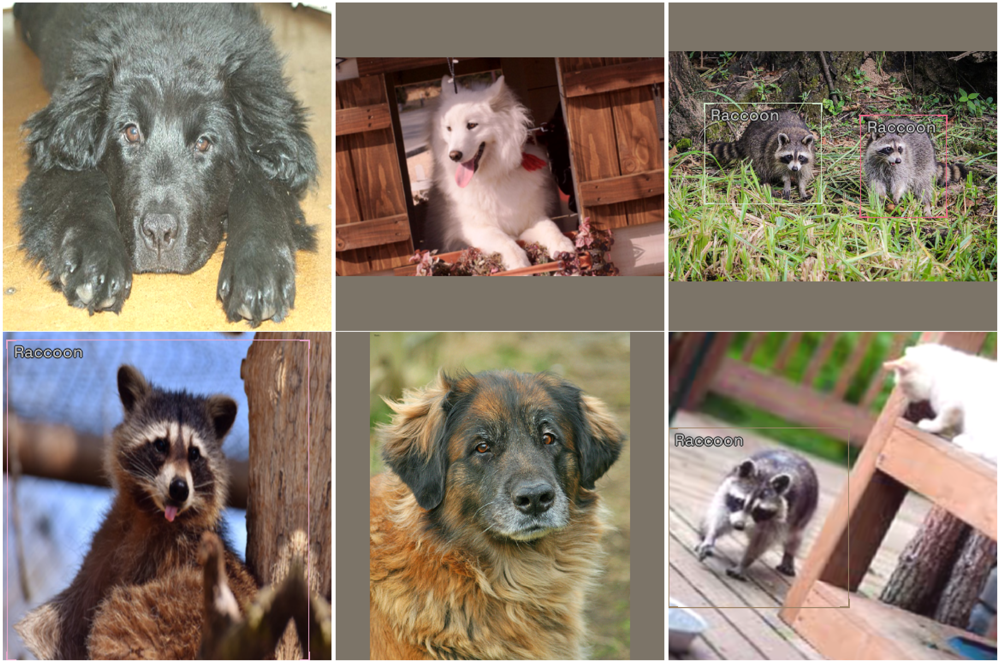

In [17]:
show_samples(random.choices(combined_train_ds, k=6), class_map=class_map, ncols=3)

## Metrics

As usual, let's stick with our `COCOMetric`:

In [18]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Models

We're now ready to train a separate model for each dataset and see how the results change!

### Raccoons only

In [19]:
backbone = model_type.backbones.tf_lite0

In [20]:
raccoon_model = model_type.model(
    backbone=backbone(pretrained=True), 
    num_classes=len(raccoon_parser.class_map), 
    img_size=size
)

raccoon_learn = model_type.fastai.learner(
    dls=[raccoon_train_dl, raccoon_valid_dl], 
    model=raccoon_model, 
    metrics=metrics
)

SuggestedLRs(valley=0.005248074419796467)

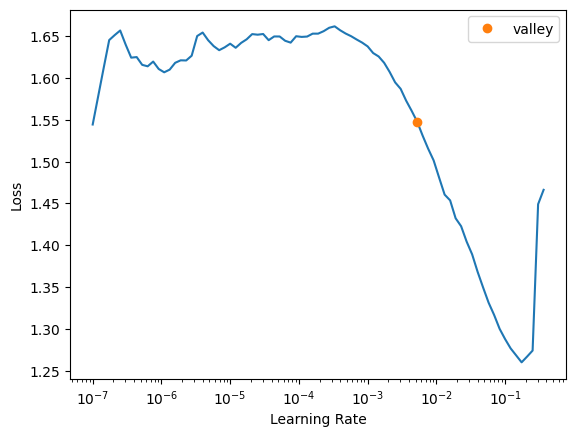

In [21]:
raccoon_learn.lr_find()

In [22]:
raccoon_learn.fine_tune(30, 0.005, freeze_epochs=5)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.597212,1.354181,0.000307,00:05
1,1.480324,1.354777,0.001507,00:04
2,1.319088,1.254850,0.034810,00:04
3,1.087830,1.081156,0.053211,00:04
4,0.928458,0.898133,0.098449,00:04


/home/ppotrykus/anaconda3/envs/icevision-dev/lib/python3.8/site-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes


epoch,train_loss,valid_loss,COCOMetric,time
0,0.579946,0.861432,0.069980,00:05
1,0.571890,0.824743,0.077679,00:05
2,0.546770,0.768505,0.090791,00:05
3,0.518292,0.676042,0.382004,00:05
4,0.507741,0.644902,0.433709,00:05
5,0.495793,0.692048,0.240042,00:05
6,0.471785,0.577972,0.508806,00:05
7,0.456929,0.624429,0.383962,00:05
8,0.436571,0.644672,0.429864,00:05
9,0.426388,0.581951,0.486592,00:05


If only raccoon photos are showed during training, everything is a raccoon!

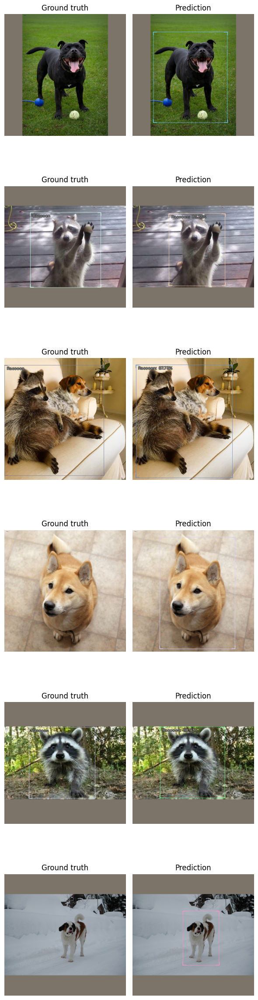

In [23]:
model_type.show_results(raccoon_model, combined_valid_ds)

### Raccoons + pets

In [25]:
combined_model = model_type.model(
    backbone(pretrained=True), 
    num_classes=len(raccoon_parser.class_map), 
    img_size=size
)

combined_learn = model_type.fastai.learner(
    dls=[combined_train_dl, combined_valid_dl], 
    model=combined_model, 
    metrics=metrics
)

In [26]:
combined_learn.fine_tune(30, 1e-2, freeze_epochs=5)

epoch,train_loss,valid_loss,COCOMetric,time
0,2.676468,20.114677,0.001932,00:07
1,1.999201,2.396560,0.075933,00:06
2,1.456598,32.068226,0.075432,00:06
3,1.105171,27.473427,0.141161,00:06
4,0.951076,24.071144,0.057629,00:06


epoch,train_loss,valid_loss,COCOMetric,time
0,0.610488,9.588224,0.115317,00:08
1,0.580771,6.247436,0.336951,00:07
2,0.559531,4.243937,0.357085,00:08
3,0.520752,1.651748,0.401737,00:08
4,0.519708,2.837212,0.371190,00:08
5,0.521373,6.292931,0.328725,00:09
6,0.476777,2.089493,0.456670,00:08
7,0.499804,6.462561,0.316811,00:08
8,0.981566,21.373594,0.285337,00:09
9,0.986519,12.665498,0.379301,00:08


When negative samples are used during training, the model is much better at understanding what **is not** a raccoon.

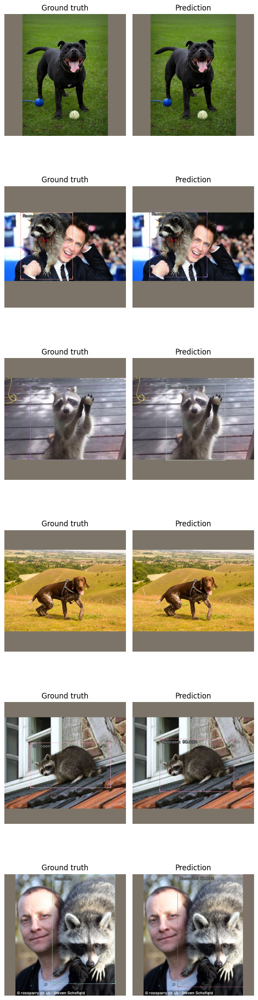

In [27]:
model_type.show_results(combined_model, combined_valid_ds)

## Happy Learning!

That's it folks! If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).